# Semantic Similarity - Experiment 03
Employing the models trained in the previous notebooks to evaluate semantic similarity in the SICK dataset.

## Introduction

### Libraries

In [6]:
## Data analysis packages:
import pandas as pd
import numpy as np

In [7]:
## Visualization packages:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
import sys
sys.path.append("../source")  # Add the directory 'source' to sys.path

In [9]:
from sca_utils import TextClassifier

### Definitions

In [10]:
## Forcing Pandas to display any number of elements
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_seq_items', None)
pd.set_option('display.width', 2000)
pd.set_option('display.max_colwidth', None)

### Importing SCA_utils methods:

In [9]:
## Instantiating the SCA Text Classifier:
classifier = TextClassifier(model_multiclass_path='../models/model_02_E.h5',
                            encoder_multiclass_path='../models/encoder_oneHot_E.pickle',
                            model_regression_path='../models/model_01_D2.h5')

In [10]:
## Testing classifier show method:
classifier.textClassifier_regression('trial')

1/1 [==============================] - 0s 104ms/step
--- trial:
38.19 of objectivity
56.73 of subjectivity


In [11]:
## Testing classifier return method:
classifier.textClassifier_getSCA_regression('trial')

1/1 [==============================] - 0s 25ms/step


(0.38186026, 0.5673055)

## Importing SICK database
SICK (Sentences Involving Compositional Knowledge) data set, from University of Trento and available at http://clic.cimec.unitn.it/composes/sick/, "consists of 10,000 English sentence pairs, built starting from two existing paraphrase sets: the [8K ImageFlickr data set](http://nlp.cs.illinois.edu/HockenmaierGroup/data.html) and the [SEMEVAL-2012 Semantic Textual Similarity Video Descriptions data set](http://www.cs.york.ac.uk/semeval-2012/task6/index.php?id=data). Each sentence pair is annotated for relatedness in meaning and for the entailment relation between the two elements."

Fields description:
- pair_ID: sentence pair ID

- sentence_A: sentence A

- sentence_B: sentence B

- entailment_label: textual entailment gold label (NEUTRAL, ENTAILMENT, or CONTRADICTION)

- relatedness_score: semantic relatedness gold score (on a 1-5 continuous scale)

- entailment_AB: entailment for the A-B order (A_neutral_B, A_entails_B, or A_contradicts_B)

- entailment_BA: entailment for the B-A order (B_neutral_A, B_entails_A, or B_contradicts_A)

- sentence_A_original: original sentence from which sentence A is derived

- sentence_B_original: original sentence from which sentence B is derived

- sentence_A_dataset: dataset from which the original sentence A was extracted (FLICKR vs. SEMEVAL)

- sentence_B_dataset: dataset from which the original sentence B was extracted (FLICKR vs. SEMEVAL)

- SemEval_set: set including the sentence pair in SemEval 2014 Task 1 (TRIAL, TRAIN, or TEST)


In [12]:
## Reading the dataset file:
data_sick = pd.read_table('../data/dataset_SICK/SICK/SICK.txt')
## Gathering general information from the dataset (it is already prepared for analysis)
data_sick.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9840 entries, 0 to 9839
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pair_ID              9840 non-null   int64  
 1   sentence_A           9840 non-null   object 
 2   sentence_B           9840 non-null   object 
 3   entailment_label     9840 non-null   object 
 4   relatedness_score    9840 non-null   float64
 5   entailment_AB        9840 non-null   object 
 6   entailment_BA        9840 non-null   object 
 7   sentence_A_original  9840 non-null   object 
 8   sentence_B_original  9840 non-null   object 
 9   sentence_A_dataset   9840 non-null   object 
 10  sentence_B_dataset   9840 non-null   object 
 11  SemEval_set          9840 non-null   object 
dtypes: float64(1), int64(1), object(10)
memory usage: 922.6+ KB


In [13]:
## Grouping by entailment label:
data_sick.groupby(['entailment_label'])['pair_ID'].agg('count').reset_index()

,entailment_label,pair_ID
0,CONTRADICTION,1424
1,ENTAILMENT,2821
2,NEUTRAL,5595


----
#### Sampling N samples labeled as "contradiction" for exploratory analysis:
*A random state is set to allow reproducibility.*

In [14]:
## Defining the number of samples:
N_sick = 5
## Choosing arbitrarily a random state:
random_state = 98

In [15]:
## Sampling the SICK data labeled as "contradiction":
sample_sick = data_sick[data_sick['entailment_label'] == 'CONTRADICTION'].sample(n=N_sick, 
                                                                                 random_state=random_state)

In [16]:
sample_sick

,pair_ID,sentence_A,sentence_B,entailment_label,relatedness_score,entailment_AB,entailment_BA,sentence_A_original,sentence_B_original,sentence_A_dataset,sentence_B_dataset,SemEval_set
591,592,"A woman is taking off a cloak, which is very large, and revealing an extravagant dress","A woman is putting on a cloak, which is very large, and concealing an extravagant dress",CONTRADICTION,3.5,A_contradicts_B,B_contradicts_A,A woman taking off a large cloak revealing a extravagant dress,A woman taking off a large cloak revealing a extravagant dress,FLICKR,FLICKR,TRIAL
9483,9643,A brown and white dog is running through the river,A brown and white dog is not running through the river,CONTRADICTION,3.6,A_contradicts_B,B_contradicts_A,a brown and white dog is running through the river,a brown and white dog is running through the river,FLICKR,FLICKR,TRAIN
4797,4921,There is no man playing a guitar,A man is singing and playing a guitar,CONTRADICTION,4.1,A_contradicts_B,B_contradicts_A,a man is singing and playing a guitar,a man is playing a guitar,SEMEVAL,SEMEVAL,TRAIN
1569,1590,The chef is carefully drying the oil from the pan,The chef is carefully pouring some oil into a pan,CONTRADICTION,3.5,A_contradicts_B,B_contradicts_A,The chef pours oil in the pan.,The chef pours oil in the pan.,SEMEVAL,SEMEVAL,TEST
4739,4861,A man is not dancing,A man is dancing,CONTRADICTION,3.8,A_contradicts_B,B_contradicts_A,a man is dancing,a man is dancing,SEMEVAL,SEMEVAL,TEST


What is the "relatedness score" variance?  
> From 1 to 5.

In [17]:
data_sick.relatedness_score.describe()

count    9840.000000
mean        3.525636
std         1.017050
min         1.000000
25%         3.000000
50%         3.600000
75%         4.300000
max         5.000000
Name: relatedness_score, dtype: float64

### Min-Max normalization of relatedness score:

$x_{\text{normalized}} = \frac{x - \min(x)}{\max(x) - \min(x)}$


In [18]:
## Normalizing the "Relatedness score", which is originally from 1 to 5 stars, to a value between 0 and 1:
data_sick['normalized_score'] = (data_sick['relatedness_score'] - data_sick['relatedness_score'].min()) / (data_sick['relatedness_score'].max() - data_sick['relatedness_score'].min())

In [19]:
data_sick.head(2)

,pair_ID,sentence_A,sentence_B,entailment_label,relatedness_score,entailment_AB,entailment_BA,sentence_A_original,sentence_B_original,sentence_A_dataset,sentence_B_dataset,SemEval_set,normalized_score
0,1,A group of kids is playing in a yard and an old man is standing in the background,A group of boys in a yard is playing and a man is standing in the background,NEUTRAL,4.5,A_neutral_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN,0.875
1,2,A group of children is playing in the house and there is no man standing in the background,A group of kids is playing in a yard and an old man is standing in the background,NEUTRAL,3.2,A_contradicts_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN,0.550


<AxesSubplot: xlabel='relatedness_score', ylabel='normalized_score'>

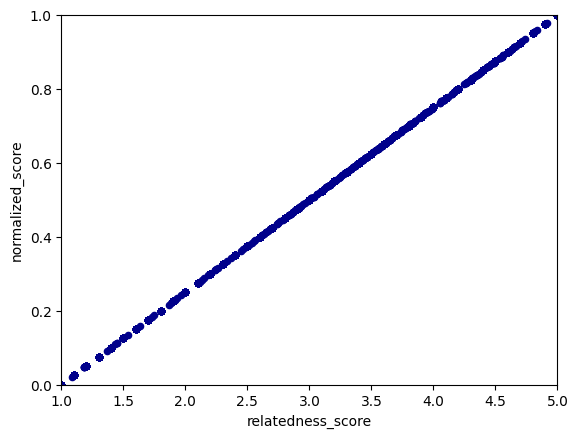

In [20]:
## Plotting "Relatedness score" versus "Normalized score". It is expected to see a line:
data_sick.plot.scatter(x='relatedness_score', y='normalized_score', c='DarkBlue', ylim=[0,1], xlim=[1,5])

----
### Picking a (not so) random phrase:

In [21]:
picked = data_sick.loc[1737]
picked

pair_ID                                             1758
sentence_A             There is no woman playing a flute
sentence_B                  One woman is playing a flute
entailment_label                           CONTRADICTION
relatedness_score                                    3.4
entailment_AB                            A_contradicts_B
entailment_BA                            B_contradicts_A
sentence_A_original        A woman is playing the flute.
sentence_B_original        A woman is playing the flute.
sentence_A_dataset                               SEMEVAL
sentence_B_dataset                               SEMEVAL
SemEval_set                                         TEST
normalized_score                                     0.6
Name: 1737, dtype: object

In [22]:
phrase_A = picked['sentence_A']
phrase_B = picked['sentence_B']
phrase_entailment = picked['entailment_label']

----
## Enriching SICK database

In [23]:
## Reading a sample of the SICK dataset:
data_sick.head(2)

,pair_ID,sentence_A,sentence_B,entailment_label,relatedness_score,entailment_AB,entailment_BA,sentence_A_original,sentence_B_original,sentence_A_dataset,sentence_B_dataset,SemEval_set,normalized_score
0,1,A group of kids is playing in a yard and an old man is standing in the background,A group of boys in a yard is playing and a man is standing in the background,NEUTRAL,4.5,A_neutral_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN,0.875
1,2,A group of children is playing in the house and there is no man standing in the background,A group of kids is playing in a yard and an old man is standing in the background,NEUTRAL,3.2,A_contradicts_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN,0.550


### Calculating similarity between the two phrases of each sample:

In [24]:
## Calculating standard similary (using en_core_web_lg) and USE similarity (en_use_lg)
data_sick['Similarity_STD'] = data_sick.apply(lambda row: classifier.nlp_core(row['sentence_A']).similarity(classifier.nlp_core(row['sentence_B'])), axis=1)
data_sick['Similarity_USE'] = data_sick.apply(lambda row: classifier.nlp_use(row['sentence_A']).similarity(classifier.nlp_use(row['sentence_B'])), axis=1)

<AxesSubplot: xlabel='normalized_score', ylabel='Similarity_STD'>

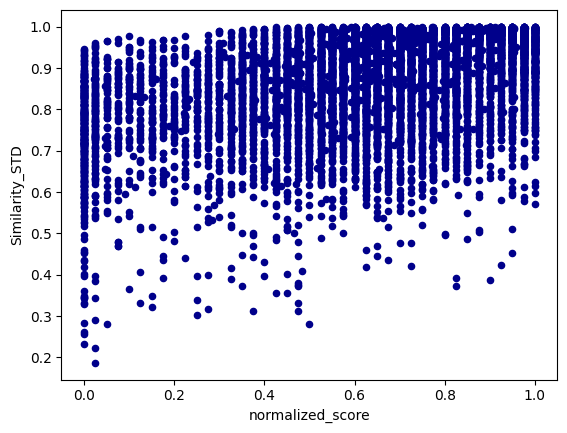

In [25]:
data_sick.plot.scatter(x='normalized_score', y='Similarity_STD', c='DarkBlue')

### Infering objectivity and subjectivity for each sentence:

In [26]:
## Infering objectivity and subjectivity values for sentence A:
data_sick[['A_obj', 'A_subj']] = data_sick.apply(lambda row: classifier.textClassifier_getSCA_regression(row['sentence_A']), axis=1, result_type='expand')

## Infering objectivity and subjectivity values for sentence B:
data_sick[['B_obj', 'B_subj']] = data_sick.apply(lambda row: classifier.textClassifier_getSCA_regression(row['sentence_B']), axis=1, result_type='expand')

1/1 [==============================] - 0s 29ms/step


### Adjusting columns order:

In [27]:
data_sick = data_sick[['pair_ID', 'sentence_A', 'sentence_B', 'entailment_label', 'normalized_score', 'Similarity_STD', 'Similarity_USE', 'A_obj', 'A_subj', 'B_obj','B_subj', 'relatedness_score', 'entailment_AB', 'entailment_BA', 'sentence_A_original', 'sentence_B_original', 'sentence_A_dataset', 'sentence_B_dataset', 'SemEval_set']]

In [28]:
data_sick.head(2)

,pair_ID,sentence_A,sentence_B,entailment_label,normalized_score,Similarity_STD,Similarity_USE,A_obj,A_subj,B_obj,B_subj,relatedness_score,entailment_AB,entailment_BA,sentence_A_original,sentence_B_original,sentence_A_dataset,sentence_B_dataset,SemEval_set
0,1,A group of kids is playing in a yard and an old man is standing in the background,A group of boys in a yard is playing and a man is standing in the background,NEUTRAL,0.875,0.971317,0.870191,0.792531,0.370976,0.826164,0.335474,4.5,A_neutral_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN
1,2,A group of children is playing in the house and there is no man standing in the background,A group of kids is playing in a yard and an old man is standing in the background,NEUTRAL,0.550,0.932352,0.547721,0.906428,0.285062,0.792531,0.370976,3.2,A_contradicts_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN


### Exporting enriched SICK dataset

In [70]:
## Exporting data
# data_sick.to_parquet('../data/enriched_SICK_data.parquet')

In [11]:
## Importing data
data_sick = pd.read_parquet('../data/enriched_SICK_data.parquet')

---
## Dataframe analysis:

In [12]:
df_analysis = data_sick[['pair_ID','normalized_score','Similarity_STD','Similarity_USE','A_obj','A_subj','B_obj','B_subj']].copy()
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9840 entries, 0 to 9839
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pair_ID           9840 non-null   int64  
 1   normalized_score  9840 non-null   float64
 2   Similarity_STD    9840 non-null   float64
 3   Similarity_USE    9840 non-null   float64
 4   A_obj             9840 non-null   float32
 5   A_subj            9840 non-null   float32
 6   B_obj             9840 non-null   float32
 7   B_subj            9840 non-null   float32
dtypes: float32(4), float64(3), int64(1)
memory usage: 461.4 KB


### Evaluating similarity error

In [13]:
df_analysis['error_STD'] = np.abs(df_analysis['normalized_score']-df_analysis['Similarity_STD'])
df_analysis['error_USE'] = np.abs(df_analysis['normalized_score']-df_analysis['Similarity_USE'])

In [100]:
# Scatter plot para normalized_score vs Similarity_STD
fig_std = px.scatter(df_analysis, x='normalized_score', y='Similarity_STD', color='error_STD',
                     hover_data=['error_STD'], title='Normalized Score vs Similarity_STD',
                     color_continuous_scale='Viridis')

fig_std.show()

# Scatter plot para normalized_score vs Similarity_USE
fig_use = px.scatter(df_analysis, x='normalized_score', y='Similarity_USE', color='error_USE',
                     hover_data=['error_USE'], title='Normalized Score vs Similarity_USE',
                     color_continuous_scale='Viridis')

fig_use.show()


In [14]:
df_analysis['avg_Obj'] = (df_analysis['A_obj'] + df_analysis['B_obj']) / 2.0
df_analysis['avg_Subj'] = (df_analysis['A_subj'] + df_analysis['B_subj']) / 2.0

In [15]:
df_analysis['max_Obj'] = df_analysis[['A_obj', 'B_obj']].max(axis=1)
df_analysis['max_Subj'] = df_analysis[['A_subj', 'B_obj']].max(axis=1)


In [16]:
df_analysis['min_Obj'] = df_analysis[['A_obj', 'B_obj']].min(axis=1)
df_analysis['min_Subj'] = df_analysis[['A_subj', 'B_obj']].min(axis=1)


In [17]:
df_analysis['delta_Obj'] = np.abs(df_analysis['A_obj'] - df_analysis['B_obj'])
df_analysis['delta_Subj'] = np.abs(df_analysis['A_subj'] - df_analysis['B_subj'])

In [101]:
# Error STD vs average objectivity
fig_error_STD_avgObj = px.scatter(df_analysis, x='error_STD', y='avg_Obj', color='error_STD',
                     hover_data=['error_STD'], title='Error STD vs Objectivity load',
                     color_continuous_scale='Viridis')

fig_error_STD_avgObj.show()

In [96]:
# Scatter plot para normalized_score vs Similarity_STD
fig_error = px.scatter(df_analysis, x='error_STD', y='avg_Subj', color='error_STD',
                     hover_data=['error_STD'], title='Error STD vs Subjectivity load',
                     color_continuous_scale='Viridis')

fig_error.show()

In [99]:
# Scatter plot para normalized_score vs Similarity_STD
fig_error = px.scatter(df_analysis, x='error_STD', y='max_Subj', color='error_STD',
                     hover_data=['avg_Subj'], title='Error STD vs Maximum Subjectivity load',
                     color_continuous_scale='Viridis')

fig_error.show()

In [103]:
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9840 entries, 0 to 9839
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pair_ID           9840 non-null   int64  
 1   normalized_score  9840 non-null   float64
 2   Similarity_STD    9840 non-null   float64
 3   Similarity_USE    9840 non-null   float64
 4   A_obj             9840 non-null   float32
 5   A_subj            9840 non-null   float32
 6   B_obj             9840 non-null   float32
 7   B_subj            9840 non-null   float32
 8   error_STD         9840 non-null   float64
 9   error_USE         9840 non-null   float64
 10  avg_Obj           9840 non-null   float32
 11  avg_Subj          9840 non-null   float32
 12  max_Obj           9840 non-null   float32
 13  max_Subj          9840 non-null   float32
 14  min_Obj           9840 non-null   float32
 15  min_Subj          9840 non-null   float32
 16  delta_Obj         9840 non-null   float32


In [105]:
## Tentativas
fig = px.scatter(df_analysis, x='delta_Obj', y='delta_Subj', color='error_STD',
                     hover_data=['avg_Subj'], title='Error STD vs Maximum Subjectivity load',
                     color_continuous_scale='Viridis')

fig.show()

----
### YData Profiling

In [107]:
from ydata_profiling import ProfileReport

In [4]:
#ProfileReport(df_analysis)

----
### Evaluating samples with the highest Error rate:

In [36]:
df_errorMax = df_analysis[(df_analysis['error_STD'] >= 0.8)]
df_errorMax.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195 entries, 319 to 9827
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pair_ID           195 non-null    int64  
 1   normalized_score  195 non-null    float64
 2   Similarity_STD    195 non-null    float64
 3   Similarity_USE    195 non-null    float64
 4   A_obj             195 non-null    float32
 5   A_subj            195 non-null    float32
 6   B_obj             195 non-null    float32
 7   B_subj            195 non-null    float32
 8   error_STD         195 non-null    float64
 9   error_USE         195 non-null    float64
 10  avg_Obj           195 non-null    float32
 11  avg_Subj          195 non-null    float32
 12  max_Obj           195 non-null    float32
 13  max_Subj          195 non-null    float32
 14  min_Obj           195 non-null    float32
 15  min_Subj          195 non-null    float32
 16  delta_Obj         195 non-null    float32

In [37]:
df_errorMin = df_analysis[(df_analysis['error_STD'] <= 0.2)]
df_errorMin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4582 entries, 0 to 9746
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pair_ID           4582 non-null   int64  
 1   normalized_score  4582 non-null   float64
 2   Similarity_STD    4582 non-null   float64
 3   Similarity_USE    4582 non-null   float64
 4   A_obj             4582 non-null   float32
 5   A_subj            4582 non-null   float32
 6   B_obj             4582 non-null   float32
 7   B_subj            4582 non-null   float32
 8   error_STD         4582 non-null   float64
 9   error_USE         4582 non-null   float64
 10  avg_Obj           4582 non-null   float32
 11  avg_Subj          4582 non-null   float32
 12  max_Obj           4582 non-null   float32
 13  max_Subj          4582 non-null   float32
 14  min_Obj           4582 non-null   float32
 15  min_Subj          4582 non-null   float32
 16  delta_Obj         4582 non-null   float32


In [38]:
df_errorMin.describe()

,pair_ID,normalized_score,Similarity_STD,Similarity_USE,A_obj,A_subj,B_obj,B_subj,error_STD,error_USE,avg_Obj,avg_Subj,max_Obj,max_Subj,min_Obj,min_Subj,delta_Obj,delta_Subj
count,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4.582000e+03,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000,4582.000000
mean,4889.759057,0.816150,0.873449,0.795130,0.851516,0.397280,0.865896,0.399246,9.382749e-02,0.078629,0.858706,0.398263,0.882490,0.866253,0.834923,0.396924,0.047567,0.075110
std,2804.536142,0.130972,0.114543,0.164200,0.095837,0.140082,0.083706,0.133577,5.735089e-02,0.072980,0.080783,0.126421,0.066773,0.082689,0.103463,0.139490,0.064981,0.073237
min,1.000000,0.025000,0.186856,0.068679,0.296842,0.122618,0.320111,0.131682,1.355677e-08,0.000006,0.347952,0.130725,0.375792,0.320111,0.296842,0.122618,0.000005,0.000050
25%,2527.250000,0.725000,0.806679,0.692895,0.827362,0.289663,0.848456,0.297214,4.339440e-02,0.023997,0.832064,0.303780,0.869736,0.848456,0.796680,0.289663,0.008207,0.021935
50%,4794.000000,0.825000,0.898988,0.829211,0.885388,0.386080,0.893404,0.395123,9.241801e-02,0.058198,0.885068,0.390161,0.902469,0.893404,0.871571,0.386080,0.021956,0.051687
75%,7365.500000,0.925000,0.970088,0.933626,0.912634,0.495244,0.917537,0.488138,1.421410e-01,0.110057,0.911612,0.484445,0.921809,0.917537,0.905130,0.494609,0.056749,0.106417
max,9907.000000,1.000000,1.000000,0.998440,0.959302,0.801621,0.965110,0.801621,1.999999e-01,0.704873,0.961800,0.790599,0.965110,0.965110,0.958490,0.796514,0.509593,0.548139


In [39]:
# ProfileReport(df_errorMin)

In [40]:
from scipy import stats

In [41]:
# Teste t para A_subj
t_stat, p_val_A_subj = stats.ttest_ind(df_errorMin['A_subj'], df_errorMax['A_subj'])
print("Teste t para A_subj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_A_subj)

# Teste t para B_subj
t_stat, p_val_B_subj = stats.ttest_ind(df_errorMin['B_subj'], df_errorMax['B_subj'])
print("\nTeste t para B_subj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_B_subj)

# Teste t para delta_subj
t_stat, p_val_delta_subj = stats.ttest_ind(df_errorMin['delta_Subj'], df_errorMax['delta_Subj'])
print("\nTeste t para delta_subj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_delta_subj)

Teste t para A_subj:
t-Statistic: -0.2931141857269062
p-Value: 0.7694476112210179

Teste t para B_subj:
t-Statistic: 1.1705028257343497
p-Value: 0.24185709056453067

Teste t para delta_subj:
t-Statistic: -13.451458783470883
p-Value: 1.6368447060021778e-40


In [42]:
# Teste t para A_obj
t_stat, p_val_A_obj = stats.ttest_ind(df_errorMin['A_obj'], df_errorMax['A_obj'])
print("Teste t para A_obj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_A_obj)

# Teste t para B_obj
t_stat, p_val_B_obj = stats.ttest_ind(df_errorMin['B_obj'], df_errorMax['B_obj'])
print("\nTeste t para B_obj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_B_obj)

# Teste t para delta_subj
t_stat, p_val_delta_obj = stats.ttest_ind(df_errorMin['delta_Obj'], df_errorMax['delta_Obj'])
print("\nTeste t para delta_obj:")
print("t-Statistic:", t_stat)
print("p-Value:", p_val_delta_obj)

Teste t para A_obj:
t-Statistic: -6.817159959641764
p-Value: 1.0439881517709298e-11

Teste t para B_obj:
t-Statistic: -4.5237671204768315
p-Value: 6.222198054436157e-06

Teste t para delta_obj:
t-Statistic: -0.39228855852604366
p-Value: 0.694862524933509


----
### Evaluating "divergent" cases with YData Profiling

In [115]:
df_divergent = df_analysis[(df_analysis['normalized_score'] >= 0.6) & (df_analysis['Similarity_STD'] <= 0.4) | (df_analysis['normalized_score'] <= 0.4) & (df_analysis['Similarity_STD'] >= 0.6)]
df_divergent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1528 entries, 71 to 9839
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pair_ID           1528 non-null   int64  
 1   normalized_score  1528 non-null   float64
 2   Similarity_STD    1528 non-null   float64
 3   Similarity_USE    1528 non-null   float64
 4   A_obj             1528 non-null   float32
 5   A_subj            1528 non-null   float32
 6   B_obj             1528 non-null   float32
 7   B_subj            1528 non-null   float32
 8   error_STD         1528 non-null   float64
 9   error_USE         1528 non-null   float64
 10  avg_Obj           1528 non-null   float32
 11  avg_Subj          1528 non-null   float32
 12  max_Obj           1528 non-null   float32
 13  max_Subj          1528 non-null   float32
 14  min_Obj           1528 non-null   float32
 15  min_Subj          1528 non-null   float32
 16  delta_Obj         1528 non-null   float32

In [61]:
import plotly.express as px

# Scatter plot para normalized_score vs Similarity_STD
fig = px.scatter(data_sick, x='normalized_score', y='Similarity_STD', title='Normalized Score vs Similarity_STD',
                 labels={'normalized_score': 'Normalized Score (N1)', 'Similarity_STD': 'Similarity_STD (S1)'},
                 color='normalized_score', color_continuous_scale='Viridis')

# Adicionando a "error zone" para Similarity_STD
fig.add_shape(type='rect', x0=0.8, y0=0, x1=1, y1=0.2, line=dict(color='Red'), fillcolor='LightSalmon', opacity=0.5)
fig.add_shape(type='rect', x0=0, y0=0.8, x1=0.2, y1=1, line=dict(color='Red'), fillcolor='LightSalmon', opacity=0.5)

fig.show()

# Scatter plot para normalized_score vs Similarity_USE
fig = px.scatter(data_sick, x='normalized_score', y='Similarity_USE', title='Normalized Score vs Similarity_USE',
                 labels={'normalized_score': 'Normalized Score (N1)', 'Similarity_USE': 'Similarity_USE (S2)'},
                 color='normalized_score', color_continuous_scale='Viridis')

# Adicionando a "error zone" para Similarity_USE
fig.add_shape(type='rect', x0=0.8, y0=0, x1=1, y1=0.2, line=dict(color='Red'), fillcolor='LightSalmon', opacity=0.5)
fig.add_shape(type='rect', x0=0, y0=0.8, x1=0.2, y1=1, line=dict(color='Red'), fillcolor='LightSalmon', opacity=0.5)

fig.show()

In [62]:
# Scatter plot para normalized_score vs Similarity_STD
fig_std = px.scatter(data_sick, x='normalized_score', y='Similarity_STD', color='delta_Subj',
                     hover_data=['delta_Obj'], title='Normalized Score vs Similarity_STD',
                     labels={'delta_Subj': 'Delta Subj', 'delta_Obj': 'Delta Obj'},
                     color_continuous_scale='Viridis')

fig_std.show()

# Scatter plot para normalized_score vs Similarity_USE
fig_use = px.scatter(data_sick, x='normalized_score', y='Similarity_USE', color='delta_Subj',
                     hover_data=['delta_Obj'], title='Normalized Score vs Similarity_USE',
                     labels={'delta_Subj': 'Delta Subj', 'delta_Obj': 'Delta Obj'},
                     color_continuous_scale='Viridis')

fig_use.show()


In [63]:
# Identificando "error zones"
high_n_low_s = data_sick[(data_sick['normalized_score'] > 0.8) & ((data_sick['Similarity_STD'] < 0.2) | (data_sick['Similarity_USE'] < 0.2))]
low_n_high_s = data_sick[(data_sick['normalized_score'] < 0.2) & ((data_sick['Similarity_STD'] > 0.8) | (data_sick['Similarity_USE'] > 0.8))]

# Exibindo as "error zones"
print("High N1, Low S1/S2:", high_n_low_s)
print("Low N1, High S1/S2:", low_n_high_s)

High N1, Low S1/S2: Empty DataFrame
Columns: [pair_ID, sentence_A, sentence_B, entailment_label, normalized_score, Similarity_STD, Similarity_USE, A_obj, A_subj, B_obj, B_subj, relatedness_score, entailment_AB, entailment_BA, sentence_A_original, sentence_B_original, sentence_A_dataset, sentence_B_dataset, SemEval_set, delta_Obj, delta_Subj]
Index: []
Low N1, High S1/S2:       pair_ID                                                                                    sentence_A                                                                                       sentence_B entailment_label  normalized_score  Similarity_STD  Similarity_USE     A_obj    A_subj     B_obj    B_subj  relatedness_score entailment_AB entailment_BA                                                   sentence_A_original                                                                      sentence_B_original sentence_A_dataset sentence_B_dataset SemEval_set  delta_Obj  delta_Subj
93         94                      

In [56]:
import plotly.express as px

# Supondo que 'data_sick' seja o seu DataFrame
fig = px.scatter(data_sick, x='normalized_score', y='Similarity_USE', color='delta_Subj',
                 hover_data=['delta_Obj'], title='Normalized Score vs Similarity_USE',
                 labels={'delta_Subj': 'Delta Subj', 'delta_Obj': 'Delta Obj'},
                 color_continuous_scale=px.colors.sequential.Viridis)

# Ajustando o layout para mostrar o título dos eixos e da barra de cores
fig.update_layout(xaxis_title='Normalized Score', yaxis_title='Similarity_USE',
                  coloraxis_colorbar=dict(title='Delta Subj'))

fig.show()

In [38]:
avg_values_per_decile = data_sick_copy.groupby('decile_normalized_score')[['A_obj', 'A_subj', 'B_obj', 'B_subj']].mean()

# Resetando o índice para tornar 'decile_normalized_score' uma coluna novamente
avg_values_per_decile = avg_values_per_decile.reset_index()

In [40]:
avg_values_per_decile

,decile_normalized_score,A_obj,A_subj,B_obj,B_subj
0,0,0.879712,0.393626,0.873931,0.388782
1,1,0.857377,0.382854,0.854629,0.384879
2,2,0.853814,0.384479,0.857756,0.377417
3,3,0.854448,0.381193,0.854963,0.378001
4,4,0.855396,0.387764,0.859109,0.384935
5,5,0.854859,0.390330,0.857253,0.394873
6,6,0.849915,0.389349,0.861651,0.395152
7,7,0.843896,0.403336,0.871809,0.408133
8,8,0.848154,0.403125,0.871175,0.402495
9,9,0.863837,0.392532,0.866340,0.394139


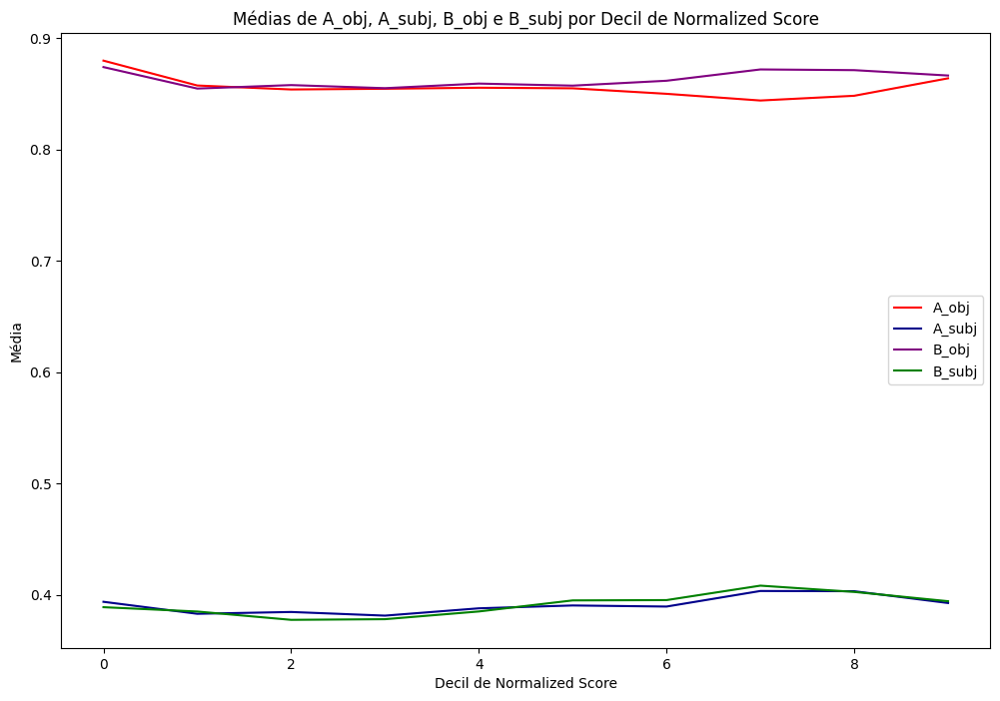

In [41]:
# Calculando a média para cada decil nas colunas de interesse
avg_values_per_decile = data_sick_copy.groupby('decile_normalized_score')[['A_obj', 'A_subj', 'B_obj', 'B_subj']].mean()

# Resetando o índice para tornar 'decile_normalized_score' uma coluna novamente
avg_values_per_decile = avg_values_per_decile.reset_index()

# Visualização das médias por decil
# Você pode utilizar uma biblioteca de visualização de sua preferência, como matplotlib ou seaborn
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))

# Plotando as médias de 'A_obj' por decil
sns.lineplot(data=avg_values_per_decile, x='decile_normalized_score', y='A_obj', label='A_obj', color='red')

# Plotando as médias de 'A_subj' por decil
sns.lineplot(data=avg_values_per_decile, x='decile_normalized_score', y='A_subj', label='A_subj', color='darkblue')

# Plotando as médias de 'B_obj' por decil
sns.lineplot(data=avg_values_per_decile, x='decile_normalized_score', y='B_obj', label='B_obj', color='purple')

# Plotando as médias de 'B_subj' por decil
sns.lineplot(data=avg_values_per_decile, x='decile_normalized_score', y='B_subj', label='B_subj', color='green')

plt.title('Médias de A_obj, A_subj, B_obj e B_subj por Decil de Normalized Score')
plt.xlabel('Decil de Normalized Score')
plt.ylabel('Média')
plt.legend()
plt.show()


----
#### What is the number of phrases with low relatedness and high similarity?

In [65]:
data_sick.head(2)

,pair_ID,sentence_A,sentence_B,entailment_label,relatedness_score,Similarity_STD,Similarity_USE,entailment_AB,entailment_BA,sentence_A_original,sentence_B_original,sentence_A_dataset,sentence_B_dataset,SemEval_set
0,1,A group of kids is playing in a yard and an old man is standing in the background,A group of boys in a yard is playing and a man is standing in the background,NEUTRAL,4.5,0.971317,0.870191,A_neutral_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN
1,2,A group of children is playing in the house and there is no man standing in the background,A group of kids is playing in a yard and an old man is standing in the background,NEUTRAL,3.2,0.932352,0.547721,A_contradicts_B,B_neutral_A,"A group of children playing in a yard, a man in the background.","A group of children playing in a yard, a man in the background.",FLICKR,FLICKR,TRAIN


In [66]:
divergentDF = data_sick[(data_sick['relatedness_score'] < 3.0) & (data_sick['Similarity_STD'] > 0.7)]

In [67]:
divergentDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1874 entries, 24 to 9837
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   pair_ID              1874 non-null   int64  
 1   sentence_A           1874 non-null   object 
 2   sentence_B           1874 non-null   object 
 3   entailment_label     1874 non-null   object 
 4   relatedness_score    1874 non-null   float64
 5   Similarity_STD       1874 non-null   float64
 6   Similarity_USE       1874 non-null   float64
 7   entailment_AB        1874 non-null   object 
 8   entailment_BA        1874 non-null   object 
 9   sentence_A_original  1874 non-null   object 
 10  sentence_B_original  1874 non-null   object 
 11  sentence_A_dataset   1874 non-null   object 
 12  sentence_B_dataset   1874 non-null   object 
 13  SemEval_set          1874 non-null   object 
dtypes: float64(3), int64(1), object(10)
memory usage: 219.6+ KB


<AxesSubplot: xlabel='relatedness_score', ylabel='Similarity_STD'>

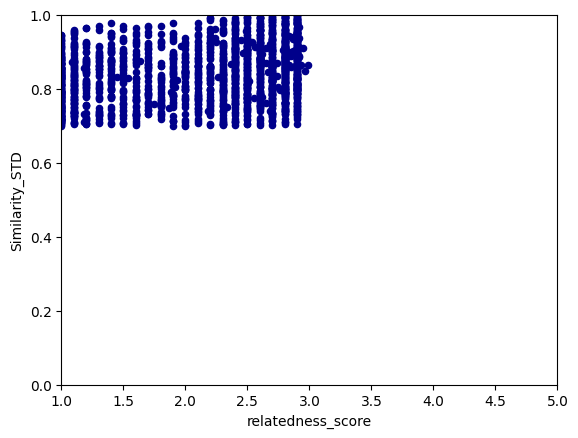

In [68]:
from matplotlib.pyplot import xlim, ylim


divergentDF.plot.scatter(x='relatedness_score', y='Similarity_STD', c='DarkBlue', ylim=[0,1], xlim=[1,5])


In [69]:
divergentDF.groupby(['entailment_label']).mean()

C:\Users\tiago\AppData\Local\Temp\ipykernel_12132\3169690571.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  divergentDF.groupby(['entailment_label']).mean()


,pair_ID,relatedness_score,Similarity_STD,Similarity_USE
entailment_label,,,,
CONTRADICTION,4835.329897,2.701546,0.886260,0.735406
ENTAILMENT,2245.500000,2.200000,0.792083,0.442598
NEUTRAL,5071.824789,2.081986,0.839049,0.410975


In [70]:
data_sick.groupby(['entailment_label']).mean()

C:\Users\tiago\AppData\Local\Temp\ipykernel_12132\1500519440.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data_sick.groupby(['entailment_label']).mean()


,pair_ID,relatedness_score,Similarity_STD,Similarity_USE
entailment_label,,,,
CONTRADICTION,4532.429073,3.594494,0.875076,0.762792
ENTAILMENT,4925.029422,4.571374,0.915735,0.872795
NEUTRAL,5188.313852,2.980850,0.845030,0.571671


### Comparing relatedness score with similarity scores:

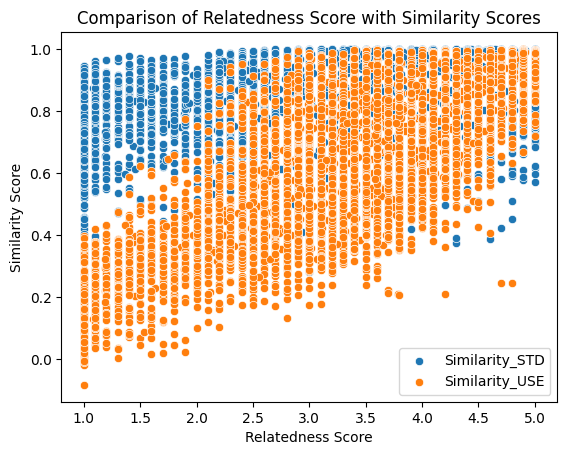

In [77]:
sns.scatterplot(x='relatedness_score', y='Similarity_STD', data=data_sick, label='Similarity_STD')
sns.scatterplot(x='relatedness_score', y='Similarity_USE', data=data_sick, label='Similarity_USE')

# Set plot labels and title
plt.xlabel('Relatedness Score')
plt.ylabel('Similarity Score')
plt.title('Comparison of Relatedness Score with Similarity Scores')

# Show legend
plt.legend()

# Show the plot
plt.show()

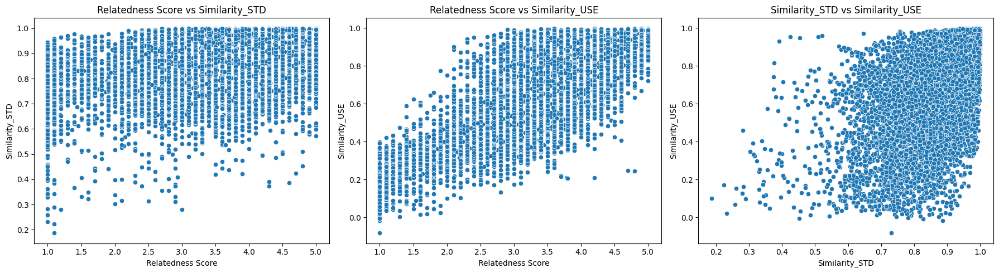

In [ ]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot for Relatedness Score vs Similarity_STD
sns.scatterplot(x='relatedness_score', y='Similarity_STD', data=data_sick, ax=axes[0])
axes[0].set_title('Relatedness Score vs Similarity_STD')
axes[0].set_xlabel('Relatedness Score')
axes[0].set_ylabel('Similarity_STD')

# Plot for Relatedness Score vs Similarity_UNI
sns.scatterplot(x='relatedness_score', y='Similarity_USE', data=data_sick, ax=axes[1])
axes[1].set_title('Relatedness Score vs Similarity_USE')
axes[1].set_xlabel('Relatedness Score')
axes[1].set_ylabel('Similarity_USE')

# Plot for Similarity_STD vs Similarity_UNI
sns.scatterplot(x='Similarity_STD', y='Similarity_USE', data=data_sick, ax=axes[2])
axes[2].set_title('Similarity_STD vs Similarity_USE')
axes[2].set_xlabel('Similarity_STD')
axes[2].set_ylabel('Similarity_USE')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()
